#Análisis de los incidentes viales para la determinación de distribuciones de densidad y comparativa de incidencia con las rutas del sistema de transporte y las principales vías de la CDMX

**Lenguaje de programación:** Python

**Equipo:** 5

**Integrantes:**

* Ximena Ávila Villagómez

* Félix Alberto Nieto García

* Alejandro De Fuentes Martínez

# Índice de contenido

0. Librerías

  0.1 Instalación de librerías

  0.2 Librerías utilizadas

1. Identificación del problema
2. Plantemiento de preguntas
3. Colección de datos

  3.1 Funciones para la adquisición de datos mediante API y su tranformación
  
  3.2 Datos de incidentes víales C5

  3.3 Datos de la demarcación territorial de la CDMX

  3.4 Datos de las vías principales de la CDMX 

  3.5 Datos de las Rutas de transporte de la CDMX

  3.6 Visualización de las rutas de transporte, vías pincipales y demarcación territorial

4. Distribución de las coordenadas

  4.1 Estimados de locabilidad y variabilidad de las coordenadas

  4.2 Distribución espacial de los accidentes de la CDMX
  
  4.3 Selección de los puntos con mayor incidencia

5. Distribución de variables categóricas

  5.1 Distribuciones generales

  5.2 Análisis Multivariable

  5.3 Visualización del análisis multivariable

6. Serie de tiempo

7. Comparación de los datos

  7.1 Rutas y vías vs alta densidad 

8. Cluster

9. Conslusiones

10. Planes a futuro

# 0. Librerias

### 0.1 Instalación de librerias 

In [ ]:
!pip install geojson;
!pip install geopandas;
!pip install pygeos
!pip install fiona shapely pyproj rtree

### 0.2 Librerias utilizadas

In [ ]:
#Manejo, tranformación y adquisición de datos
import pandas as pd 
import numpy as np  
import json #Manejo de archivos json
import requests #Para hacer solicitudes HTTP
import geojson
import geopandas as gpd
from shapely.geometry import Point, Polygon,LineString, MultiLineString

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [ ]:
#Graficación
import seaborn as sns  
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import folium  # Visualización de datos en mapas interactivos
import folium.plugins #Herramientas para mapas interactivos
import branca.colormap as cm

In [ ]:
#Calculos estadisticos y clasificación
from scipy import stats #1
from scipy.stats import skew, kurtosis #2
from sklearn.cluster import KMeans
from scipy.spatial import Voronoi, voronoi_plot_2d

In [ ]:
from sklearn.linear_model import LinearRegression

## 1. Identificación del problema

Los accidentes de tránsito son una de las principales causas de muerte a nivel nacional e incluso a nivel mundial, representan un problema de seguridad vial que requiere de un análisis cuidadoso así como de estudios continuos para buscar soluciones que disminuyan su frecuencia.

Resulta de interés comprender el panorama de los incidentes viales en la CDMX con la finalidad de identificar tendencias, observar y agrupar frecuencias y determinar, si es posible, la relación de los incidentes viales con otros fenómenos.  Esto constituye el punto de partida de la problemática elegida, con la intención de reportar los hallazgos del análisis de datos que puedan ser útiles para la propuesta de soluciones integrales posteriores.



## 2 Planteamiento de preguntas

1. ¿Cómo se distribuyen los accidentes a lo largo del territorio de la CDMX?
2. ¿Cuál es la densidad de incidentes por km^2 que presenta cada delegación?
3. ¿Cuáles son las regiones que presentan una mayor densidad de accidentes?
4. ¿Cuáles son las características que presentan las regiones con alta frecuencia de incidentes?

## 3 Coleccion de los datos

### 3.1 Funciones para la adquisición de datos mediante API y su tranformación

In [ ]:
#Función para adquirir datos mediante API
def get_data_API(link):
  r = requests.get(link)
  r.status_code
  consulta = r.json()
  D = pd.json_normalize(consulta['result']['records'])
  r.close()
  df = pd.DataFrame.from_dict(D)
  return df

In [ ]:
def clean_data(df):
  col = df.columns
  if 'geometry' in col:
    geoname = 'geometry'
  elif 'geo_shape' in col:
    geoname = 'geo_shape'
  else:
    geoname = 'no'

  if 'geo_point_2d' in col:
    geopoint = 'geo_point_2d'
  elif "geopoint" in col:
    geopoint = 'geopoint'
  else:
    geopoint = 'no'


  if geoname != 'no':
    df['geometry'] = df[geoname].apply(lambda x: json.loads(x))

  if geopoint != 'no':
    df[['latitud','longitud']] = df[geopoint].str.split(',',expand=True).astype(float)

  borrar =  ['geo_shape','id','_id']
  b = []
  for i in borrar:
    if i in col:
      b.append(i)
  if geopoint != 'no':
    b.append(geopoint)
  
  df = df.drop(columns=b)

  return df

In [ ]:
def transform_geometry(diccionario):
  if diccionario['type'] == 'Polygon':
    return Polygon(diccionario['coordinates'][0])
  elif diccionario['type'] == 'LineString':
    return LineString(diccionario['coordinates'])
  elif diccionario['type'] == 'Point':
    return Point(diccionario['coordinates'])
  elif diccionario['type'] == 'MultiLineString':
      return MultiLineString(diccionario['coordinates'])

def set_geometry(df,columna):
  df[columna] = df[columna].apply(lambda x:transform_geometry(x))
  return gpd.GeoDataFrame(df,crs='EPSG:4326')

def transform_data(df):
  col = df.columns
  if ('geometry' in col) :
    df = set_geometry(df, columna='geometry')
  elif ('latitud' in col) and ('longitud' in col):
    df = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['longitud'], df['latitud']),crs='EPSG:4326')
  
  elif 'WKT' in col:
    df['geometry'] = gpd.GeoSeries.from_wkt(df['WKT'])
    df = gpd.GeoDataFrame(df,geometry='geometry',crs='EPSG:4326')
    df = df.drop(columns=['WKT']) 

  return df

### 3.2 Datos de incidentes víales C5 


El Centro de Comando, Control, Cómputo, Comunicaciones y Contacto Ciudadano  ([C5](https://www.c5.cdmx.gob.mx/dependencia/acerca-de/el-c5-de-la-cdmx)) de la Ciudad de México es la dependencia del Gobierno de la Ciudad de México encargada de captar información para la toma de decisiones en la capital del país a través del video monitoreo, de la captación de llamadas telefónicas y de aplicaciones informáticas de inteligencia.

El conjunto de datos que utilizamos corresponde a los [incidentes viales](https://datos.cdmx.gob.mx/dataset/incidentes-viales-c5) reportados por el  C5 de la CDMX desde 2014 hasta el 2021 y actualizado mensualmente. Se recolectaron dos datasets correspondientes a los años 2014-2020 y 2021 en la página de [datos abiertos de la ciudad de méxico](https://datos.cdmx.gob.mx). 

 **Información** (Descripción del diccionario de datos)

1. **Folio** (campo llave): \\
Código único alfanumérico que se la asigna a cada uno de los incidentes que son generados, está compuesto por dos iniciales del Centro que recibió la emergencia, fecha en formato AA/MM/DD y número consecutivo de ingreso, ejemplo: AO/181201/10801

2. **Fecha de creación**: \\
Fecha de apertura del folio del evento, DD/MM/AAAA

3. **Día de la semana**: \\
Día de apertura del folio,Lunes-Domingo

4. **Fecha de cierre**: \\
Fecha de cierre del folio del evento,DD/MM/AAAA
 

5. **Incidente**: \\
Tipos de incidente reportados.

6. **Alcaldía de inicio del incidente**: \\
Una de las 16 alcaldías que constituyen la Ciudad de México

7. **Latitud**: \\
Referencia geográfica aproximada de la ubicación del incidente

8. **Longitud**: \\
Referencia geográfica aproximada de la ubicación del incidente

9. **Código de cierre**:
Código que fue asignado al incidente en el cierre
 Afirmativo(A),Informativo	(I), Negativo	(N),Duplicado	(D),Falso (F).

10. **Clasificación**: \\
Clasificación del incidente, Emergencia, Urgencias Médicas, Falsa Alarma, Delito

11. **Tipo de entrada**: \\
Medio por el cual se dio aviso del incidente
 Botón de auxilio,  Cámara ,Llamada App 911, Llamada del 911, Radio, Redes, Aplicativos

12. **Alcaldía de cierre del incidente**: \\
Alcaldía donde cierra el folio del incidente.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Introduzca la ubicación de los datos de incidentes viales
path = " .../datos_limpios.csv"
data_incidentes = pd.read_csv(path,index_col='Unnamed: 0');

/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [ ]:
for i in ['fecha_creacion','fecha_cierre']:
  data_incidentes[i] = pd.to_datetime(data_incidentes[i])

In [ ]:
data_code_A = transform_data(data_incidentes)

In [ ]:
data_incidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1424673 entries, 0 to 1424672
Data columns (total 15 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   folio              1424673 non-null  object        
 1   ano                1424673 non-null  int64         
 2   mes                1424673 non-null  int64         
 3   dia_semana         1424673 non-null  object        
 4   incidente_c4       1424673 non-null  object        
 5   codigo_cierre      1424673 non-null  object        
 6   latitud            1424673 non-null  float64       
 7   longitud           1424673 non-null  float64       
 8   tipo_entrada       1424673 non-null  object        
 9   clas_con_f_alarma  1424673 non-null  object        
 10  delegacion_inicio  1424673 non-null  object        
 11  delegacion_cierre  1424673 non-null  object        
 12  fecha_creacion     1424673 non-null  datetime64[ns]
 13  fecha_cierre       1424673 

In [ ]:
#Se seleccionan todos los datos que son afirmativos
data_code_A = data_incidentes[data_incidentes['codigo_cierre']== 'A']

In [ ]:
data_code_A.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 614541 entries, 0 to 1424672
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   folio              614541 non-null  object        
 1   ano                614541 non-null  int64         
 2   mes                614541 non-null  int64         
 3   dia_semana         614541 non-null  object        
 4   incidente_c4       614541 non-null  object        
 5   codigo_cierre      614541 non-null  object        
 6   latitud            614541 non-null  float64       
 7   longitud           614541 non-null  float64       
 8   tipo_entrada       614541 non-null  object        
 9   clas_con_f_alarma  614541 non-null  object        
 10  delegacion_inicio  614541 non-null  object        
 11  delegacion_cierre  614541 non-null  object        
 12  fecha_creacion     614541 non-null  datetime64[ns]
 13  fecha_cierre       614541 non-null  datetim

In [ ]:
data_code_A.head(5)

,folio,ano,mes,dia_semana,incidente_c4,codigo_cierre,latitud,longitud,tipo_entrada,clas_con_f_alarma,delegacion_inicio,delegacion_cierre,fecha_creacion,fecha_cierre,geometry
0,GA/160123/05714,2016,1,Sábado,accidente-choque sin lesionados,A,19.422113,-99.084643,BOTÓN DE AUXILIO,EMERGENCIA,VENUSTIANO CARRANZA,VENUSTIANO CARRANZA,2016-01-23,2016-01-24,POINT (-99.08464 19.42211)
1,AO/160123/05826,2016,1,Sábado,accidente-choque con lesionados,A,19.358320,-99.297641,BOTÓN DE AUXILIO,URGENCIAS MEDICAS,CUAJIMALPA,CUAJIMALPA,2016-01-23,2016-01-24,POINT (-99.29764 19.35832)
4,C4/160124/01334,2016,1,Domingo,accidente-choque sin lesionados,A,19.452900,-99.215870,LLAMADA DEL 066,EMERGENCIA,MIGUEL HIDALGO,MIGUEL HIDALGO,2016-01-24,2016-01-24,POINT (-99.21587 19.45290)
6,GA/160123/05517,2016,1,Sábado,accidente-choque con lesionados,A,19.467682,-99.095834,BOTÓN DE AUXILIO,URGENCIAS MEDICAS,GUSTAVO A. MADERO,GUSTAVO A. MADERO,2016-01-23,2016-01-24,POINT (-99.09583 19.46768)
7,C4/160124/03357,2016,1,Domingo,accidente-choque con lesionados,A,19.414310,-99.087160,RADIO,URGENCIAS MEDICAS,VENUSTIANO CARRANZA,VENUSTIANO CARRANZA,2016-01-24,2016-01-24,POINT (-99.08716 19.41431)


### 3.3 Datos de las Demarcaciones territoriales de la CDMX

Los datos de la [delimitación territorial de la CDMX ](https://datos.cdmx.gob.mx/dataset/alcaldias) contiene información de las 16 alcaldías de las CDMX y sus respectivos conjuntos de puntos que crean polígonos delimitadores. 

 **Información** (Descripción del diccionario de datos)

1. **Nombre**
  Nombre de la delegación

2. **clave_minicipio:**
  Clave asignada a cada una de las delegaciones

3. **geo_shape:**
  Diccionario de lel tipo de polígono y una lista que contiene el conjuto de puntos que forman el poligono.

4. **geo_point_2d:**
  Punto central del polígono

In [ ]:
#delimitación de las alcaldias
#https://datos.cdmx.gob.mx/dataset/limite-de-las-alcaldias/resource/dbb00cee-3660-43f6-89c2-8beb433292a8
link_alcaldia = 'https://datos.cdmx.gob.mx/dataset/bae265a8-d1f6-4614-b399-4184bc93e027/resource/e4a9b05f-c480-45fb-a62c-6d4e39c5180e/download/alcaldias.csv'

In [ ]:
alcaldias = pd.read_csv(link_alcaldia)
alcaldias = clean_data(alcaldias)
alcaldias = transform_data(alcaldias)

In [ ]:
alcaldias = alcaldias.drop(columns=['cvegeo','cve_ent','municipio'])
alcaldias=alcaldias.rename( columns={'nomgeo':'Alcaldia','cve_mun':'numero_id'})

In [ ]:
alcaldias['Alcaldia'] = alcaldias['Alcaldia'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
alcaldias['Alcaldia'] = alcaldias['Alcaldia'].str.upper()
alcaldias = alcaldias.sort_values('Alcaldia').reset_index(drop=True)
alcaldias['Alcaldia'] =  alcaldias['Alcaldia'].str.replace('^LA ','').str.replace(' DE MORELOS','')

In [ ]:
alcaldias

,Alcaldia,numero_id,geometry,latitud,longitud
0,ALVARO OBREGON,10,"POLYGON ((-99.18871 19.39475, -99.18868 19.394...",19.336176,-99.246820
1,AZCAPOTZALCO,2,"POLYGON ((-99.18231 19.50748, -99.18229 19.507...",19.485329,-99.182107
2,BENITO JUAREZ,14,"POLYGON ((-99.13679 19.40156, -99.13682 19.401...",19.380642,-99.161135
3,COYOACAN,3,"POLYGON ((-99.13923 19.35687, -99.13772 19.356...",19.326667,-99.150376
4,CUAJIMALPA,4,"POLYGON ((-99.25698 19.40043, -99.25694 19.400...",19.324634,-99.310729
5,CUAUHTEMOC,15,"POLYGON ((-99.12919 19.46247, -99.12884 19.462...",19.431373,-99.149056
6,GUSTAVO A. MADERO,5,"POLYGON ((-99.11860 19.58446, -99.11691 19.581...",19.504065,-99.115864
7,IZTACALCO,6,"POLYGON ((-99.05584 19.42196, -99.05589 19.421...",19.396912,-99.094330
8,IZTAPALAPA,7,"POLYGON ((-99.05813 19.40072, -99.05814 19.400...",19.349166,-99.056799
9,MAGDALENA CONTRERAS,8,"POLYGON ((-99.20859 19.33610, -99.20867 19.335...",19.268977,-99.268413


### 3.4 Datos de las vías principales de la CDMX

In [ ]:
link_vias_principales = 'https://datos.cdmx.gob.mx/dataset/b3514d29-dedc-4006-90f3-156e0c56fb90/resource/44bc1807-a7ba-44a0-bf46-504623a30905/download/vialidades-de-la-ciudad-de-mexico.csv'

In [ ]:
viasprincipales = pd.read_csv(link_vias_principales)
viasprincipales = clean_data(viasprincipales)
viasprincipales = transform_data(viasprincipales)

In [ ]:
viasprincipales.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 473 entries, 0 to 472
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   nombre    473 non-null    object  
 1   inicia    473 non-null    object  
 2   termina   473 non-null    object  
 3   tipo_via  473 non-null    object  
 4   vel_max   473 non-null    int64   
 5   geometry  473 non-null    geometry
 6   latitud   473 non-null    float64 
 7   longitud  473 non-null    float64 
dtypes: float64(2), geometry(1), int64(1), object(4)
memory usage: 29.7+ KB


In [ ]:
viasprincipales.head(5)

,nombre,inicia,termina,tipo_via,vel_max,geometry,latitud,longitud
0,Circuito Interior Jose Vasconcelos,Eje 4 Sur Benjamin Franklin,Paseo de la Reforma,Via de acceso controlado,80,"LINESTRING (-99.17767 19.42357, -99.17781 19.4...",19.415489,-99.180219
1,Circuito Interior Instituto Tecnico Industrial,Av. Ribera de San Cosme,Eje 2 Norte Eulalia Guzman,Via de acceso controlado,80,"LINESTRING (-99.16261 19.45961, -99.16293 19.4...",19.451673,-99.164284
2,Circuito Interior Boulevard Puerto Aereo,Fundidora de Monterrey,Eje 1 Sur Fray Servando Teresa de Mier,Via de acceso controlado,80,"LINESTRING (-99.09791 19.41693, -99.09730 19.4...",19.426655,-99.092506
3,Circuito Interior Rio Mixcoac,Av. Universidad,Av. Revolucion,Via de acceso controlado,80,"LINESTRING (-99.18749 19.37234, -99.18707 19.3...",19.366208,-99.179404
4,Circuito Interior Av. Revolucion,Eje 4 Sur Benjamin Franklin,Molinos,Via de acceso controlado,80,"LINESTRING (-99.18422 19.40781, -99.18426 19.4...",19.389985,-99.186061


### 3.5 Datos de las Rutas de transporte de la CDMX

In [ ]:
#Rutas transporte publico concesionado
#https://datos.cdmx.gob.mx/dataset/rutas-y-corredores-del-transporte-publico-concesionado/resource/0246fa92-8ee8-4a0a-a974-f8b2f84f4f1b
#link_rutas = "https://datos.cdmx.gob.mx/api/3/action/datastore_search?resource_id=0246fa92-8ee8-4a0a-a974-f8b2f84f4f1b"
link_rutas = "https://datos.cdmx.gob.mx/dataset/7c2d9504-3d22-4204-977f-92806e73fce2/resource/0246fa92-8ee8-4a0a-a974-f8b2f84f4f1b/download/___.csv"

In [ ]:
rutas = pd.read_csv(link_rutas)
rutas = transform_data(rutas)

In [ ]:
rutas.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2311 entries, 0 to 2310
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   id          2311 non-null   int64   
 1   tipo_trans  2307 non-null   object  
 2   ruta_corre  2307 non-null   object  
 3   detalle     2311 non-null   object  
 4   detalle_2   1411 non-null   object  
 5   descrip     2307 non-null   object  
 6   geometry    2311 non-null   geometry
dtypes: geometry(1), int64(1), object(5)
memory usage: 126.5+ KB


In [ ]:
rutas.head()

,id,tipo_trans,ruta_corre,detalle,detalle_2,descrip,geometry
0,1002,RUTAS DE TRANSPORTE,RUTA 28,R-28,Suburbia Toreo - Metro San Cosme,RUTA 28 028 Metro San Cosme - Suburbia Toreo,"LINESTRING (-99.21804 19.45178, -99.21528 19.4..."
1,1005,RUTAS DE TRANSPORTE,RUTA 28,R-28,Nonoalco - 4 Caminos,RUTA 28 028 Nonoalco - Metro Cuatro Caminos,"LINESTRING (-99.21649 19.45675, -99.21641 19.4..."
2,1010,RUTAS DE TRANSPORTE,RUTA 2,R-2,LA RAZA - AZCAPOTZALCO,RUTA 2 002 AZCAPOTZALCO - LA RAZA,"LINESTRING (-99.13993 19.46880, -99.14129 19.4..."
3,1016,RUTAS DE TRANSPORTE,RUTA 2,002 SATELITE 2,NaN,RUTA 2 002 CHAPULTEPEC - SATELITE 2,"LINESTRING (-99.20929 19.55230, -99.20813 19.5..."
4,1100,RUTAS DE TRANSPORTE,RUTA 30,RUTA 30 EDOMEX,Tlahuac - Paseos Villas,RUTA 30 METROPOLITANA Recorrido Actual,"LINESTRING (-98.99838 19.26564, -98.99702 19.2..."


### 3.6 Visualización de las rutas de transporte, vías principales y demarcación territoral

In [ ]:
def add_data(data,mapa,nombre,color='black',grosor=0.5):
  capa = folium.FeatureGroup(nombre)
  for _, r in data.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                              style_function=lambda feature: { #'fillColor': 'blue',
                                                              'color' : color, 'weight' : grosor, 'fillOpacity' : 0} )
    
    geo_j.add_to(capa)
    capa.add_to(mapa)

In [ ]:
#Se crea un mapa para añadir información
centro = [19.432566, -99.133195]
Tmap =['Stamen Terrain','CartoDB Positron','Mapbox', ]
mapa_cdmx = folium.Map(location= centro, tiles=Tmap[1],
                       zoom_start=10,prefer_canvas=True,
                       max_zoom=16,min_zoom=9,
                       width='70%',height='70%')

In [ ]:
add_data(alcaldias,mapa_cdmx,'Alcaldias','black',grosor=1)
add_data(rutas,mapa_cdmx,'Rutas','blue',grosor=0.2)
add_data(viasprincipales,mapa_cdmx,'Vías principales','red',grosor=0.7)

In [ ]:
folium.map.LayerControl('topleft', collapsed= False).add_to(mapa_cdmx)

In [ ]:
mapa_cdmx

## 4. Distribución de las coordenadas

 ### 4.1 Estimados de locación y variabilidad de las coordenadas

**Descripción:**

Se realizó un filtro para obtener todos los datos con código A, de este modo no se consideran los datos duplicatos, falsos, negativos e informativos. 

Dentro del dataset, los datos de Latitud y Longitud son los únicos númericos. Con ello estimaremos las región de mayor acumulación de accidentes

In [ ]:
def get_measures(columna):
  info = {}
  info['mean'] = columna.mean()
  info['median'] = columna.median()
  info['std'] = columna.std()
  info['trim mean'] = stats.trim_mean(columna, 0.1)
  info['max'] = columna.max()
  info['min'] = columna.min()
  info['range'] = info['max']-info['min']
  info['quantile'] = columna.quantile([0.1,0.25,0.5,0.75,0.9])
  info['range quantile'] = info['quantile'][0.75] - info['quantile'][0.25]

  return info

def get_info(df):
  data = {}
  for i in df.columns:
    data[i] = get_measures(df[i])
  return  pd.DataFrame.from_dict(data)


In [ ]:
informacion  = get_info(data_code_A[['latitud','longitud']])

In [ ]:
informacion

,latitud,longitud
mean,19.3876,-99.1376
median,19.3902,-99.1413
std,0.0685139,0.0594352
trim mean,19.3892,-99.1387
max,19.5793,-98.9454
min,19.094,-99.3545
range,0.4853,0.409129
quantile,0.10 19.295754 0.25 19.341930 0.50 19...,0.10 -99.208020 0.25 -99.177785 0.50 -99...
range quantile,0.09591,0.0785352


Los accidentes se encuentran dentro del rectangulo  Latitud $[19.094,19.5793]$ y longitud $[-99.3545,-98.9454]$. Con ello podemos ver que la latitud tiene un mayor rango $(0.4853)$, esto se debe a que la CDMX tiene una forma alargada en la dirección de la latidudes. El  punto medio de todo el conjunto de accidentes se encuentra en $[19.3876,-99.1376]$. Además la latitud tiene mayor dispersión, lo que significa que los valores de latitud tiene un mayor distribución a lo largo de esa dirección.

In [ ]:
print('Distancia del máximo\n',abs(informacion.loc['max']-informacion.loc['mean']))
print('Distancia del mínimo\n',abs(informacion.loc['mean']-informacion.loc['min']))

Distancia del máximo
 latitud     0.191683
longitud     0.19222
dtype: object
Distancia del mínimo
 latitud     0.293617
longitud    0.216909
dtype: object


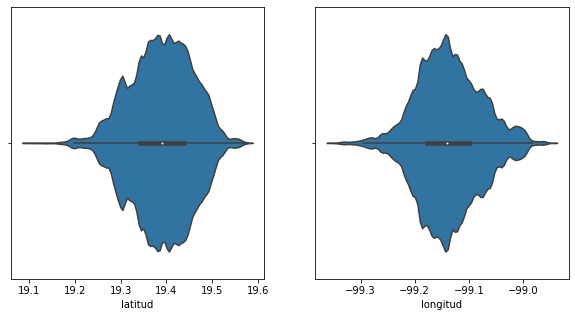

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
sns.violinplot(data=data_code_A, x='latitud',ax=axes[0])
sns.violinplot(data=data_code_A, x='longitud',ax=axes[1])

Con la distancia calculada que existe de la media a los extremos del rectangulo podemos determinar que el centro geometrico se encuentra en la parte norte del rectangulo que encierra a la ciudad. Además al observar los cuantiles se determina que la mayor parte de la infomación se encuentra localizada en la parte norte de la ciudad del mismo modo que la media.

###   4.2 Distribución espacial de los accidentes en la CDMX


**Descripción:**

Con todos los datos reportados con código afirmativos, se realizó una clasificación por kilimetro, usando la relación un grado equivale aproximadamente a 111,1 km. Con ella graficó un la distribución y se analizó las propiedades

In [ ]:
#Función para realizar un filtro de los valores atípicos de una columande un dataframe
def filto_vatipicos(df,columna,porcentaje=1.5):
  iqr = df[columna].quantile(0.75) - df[columna].quantile(0.25)
  filtro_inferior = df[columna] > df[columna].quantile(0.25) - (iqr * porcentaje)
  filtro_superior = df[columna] < df[columna].quantile(0.75) + (iqr * porcentaje)
  df_filtrado = df[columna][filtro_inferior & filtro_superior]
  
  return df.loc[df_filtrado.index]

#Función para realizar un filtro de los valores atípicos de las columnas seleccionadas
def datafiltro_vatipicos(df,columnas,porcentaje=1.5):
  new_data = df.copy()
  for i in columnas:
    new_data = filto_vatipicos(new_data,i,porcentaje=1.5)
  return new_data

In [ ]:
#Función para calcular la distribución de valores de algúna columna númerica
def distribucion(columnas,escala = 111.1):
  r = columnas.max()-columnas.min()
  bin = round(r*escala).astype('int64')
  table = {}
  for i,j in zip(bin.index,bin.values):
    seg = pd.cut(columnas[i],j)
    f = columnas[i].groupby(seg).count()
    table[i] = f
    return table

In [ ]:
#frec = distribucion(data_code_A[['latitud','longitud']])

In [ ]:
#Función para graficar un histograma 2d, grafico de barras y la distribución en dos direcciones de un dataframe
def graf_bar_hist(data,xdata,ydata,delimitacion ='No', k=1/111.1,colormap="Blues",titulo=''):

  #Caracteristicas del plots
  fig, axes = plt.subplots(3, 3, figsize=(10, 10),
                           gridspec_kw={"height_ratios": (.2,0.1, .7),"width_ratios": (.7,0.1, .2)})
  plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.02, hspace=0.02)

  #Colobar
  axins = inset_axes(axes[2,0],width="50%", height="2%",  loc='upper left', 
                     bbox_to_anchor=(0.02, 0.05, 0.9, 0.9), 
                     bbox_transform=axes[2,0].transAxes, borderpad=0)
  axins.set_title('No. Accidentes',fontsize=8)

  #General
  sns.histplot(data=data ,x=xdata, y=ydata,cmap= colormap,ax=axes[2,0],
               binwidth=k,kde=True,cbar=True,
               cbar_kws={'orientation':'horizontal'},cbar_ax=axins)
  
  axes[0,2].text(x=-0.2,y=0.8,s=titulo,fontsize=13)
  axes[0,2].text(x=-0.2,y=0.6,s='Datos')
  axes[0,2].text(x=-0.2,y=0.4,s=f'Curtosis x: {round(kurtosis(data[xdata]),4)}\nAsimetría x: {round(skew(data[xdata]),4)}')
  axes[0,2].text(x=-0.2,y=0,s=f'Curtosis y: {round(kurtosis(data[ydata]),4)}\nAsimetría y: {round(skew(data[ydata]),4)}')
  axes[0,2].text(x=-0.2,y=-0.2,s=f'width bins={round(k,4)}°({round(k*111.1,4)}km)')

  #latitud
  sns.histplot(data=data,x=xdata , binwidth=k,kde=True,ax=axes[0,0])
  axes[0,0].axvline(data[xdata].quantile(0.5), color='red')
  #axes[0,1].text(x=0.1,y=0.5,s=f'Curtosis: {round(kurtosis(data[xdata]),4)}\n Asimetría: {round(skew(data[xdata]),4)}')
  
  sns.boxplot(data=data,x=xdata,ax=axes[1,0])

  #longitud
  sns.histplot(data=data, y=ydata, binwidth=k,kde=True,ax=axes[2,2])
  axes[2,2].axhline(data[ydata].quantile(0.5), color='red')
  #axes[1,2].text(x=0,y=0.1,s=f'Curtosis: {round(kurtosis(data[ydata]),4)}\n Asimetría: {round(skew(data[ydata]),4)}')

  sns.boxplot(data=data,y=ydata,ax=axes[2,1])

  #Configuraciones
  borrar = [(0,1),(0,2),(1,2),(1,1)]
  for i in borrar:
    axes[i].axis('off')

  rnoshow = [ (0,0),(1,0)]
  for i in rnoshow:
    axes[i].set_xticklabels(())
    axes[i].set_xlabel(" ")

  cnoshow = [ (2,2),(2,1)]
  for i in cnoshow:
    axes[i].set_yticklabels(())
    axes[i].set_ylabel(" ")
  
  axes[2,0].set_xlim([data[xdata].min(),data[xdata].max()])
  axes[2,0].set_ylim([data[ydata].min(),data[ydata].max()])


  #Cuadrado
  xl = data[xdata].quantile([0.25 ,0.75,0.75,0.25,0.25]) 
  yl = data[ydata].quantile([0.25 ,0.25,0.75,0.75,0.25]) 


  #delimitacion territorial
  if type(delimitacion) == type(gpd.GeoDataFrame(columns=['A'])):
    delimitacion.plot(ax=axes[2,0],facecolor="none", edgecolor='black', lw=0.5,
                      figsize=(7,7))
    axes[2,0].set_aspect('auto')

  axes[2,0].plot(xl,yl,color='r',label='Rango Intercuantil', linestyle="--")
  axes[2,0].plot(data[xdata].quantile(0.5),data[ydata].quantile(0.5),'or')

  for i in  data[xdata].quantile([0.1,0.25,0.5,0.75,0.9]):
    axes[2,0].axvline(i, color='black',linewidth=0.5, linestyle="--")

  for i in  data[ydata].quantile([0.1,0.25,0.5,0.75,0.9]):
    axes[2,0].axhline(i, color='black',linewidth=0.5, linestyle="--")
  
  axes[2,0].axvline(data[ydata].quantile(0.5), color='black',linewidth=0.5, 
                    linestyle="--",label='cuantiles')
  axes[2,0].legend(loc='lower left')

  return fig,axes

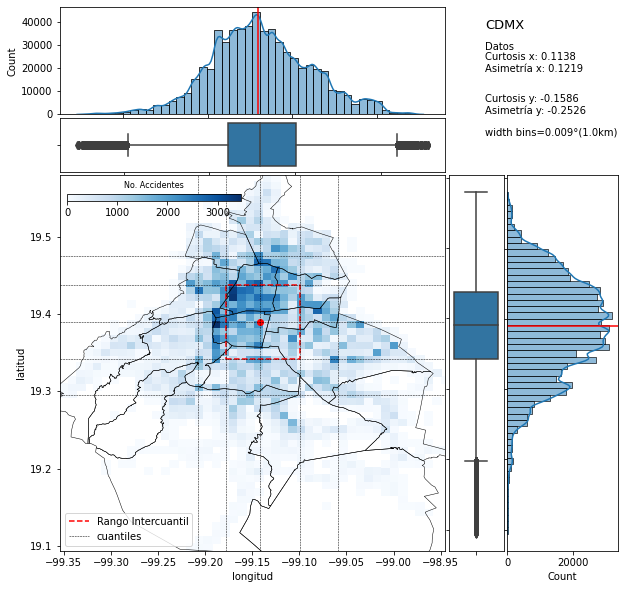

In [ ]:
#Se grafica todos los datos de accidentes
graf_bar_hist(data_code_A,xdata='longitud',ydata='latitud', k=1/111.1,delimitacion=alcaldias,titulo='CDMX');

Se eligió un widthbins de $1 km$, entonces se observa el conteo de accidentes por $km^2$. Se observa que en la parte norte de la ciudad se encuentran distribuidos los accidentes con mayor frecuencia. Se puede observar que la distribución en las dos direcciones tiene una curtosis menor a 0.2. Por otra parte la simetría  en $x$ igual $0.1219$ nos dice que están ligeremente distribuidos a la parte derecha de la ciudad. En cuando a $y$ la simetría es negativa $-0.25$ que la distrbución de accidentes en la latitud se encuentra orientada a la parte norte. Cabe señalar que la mayor parte de la urbanización acrecido en mayor medida en la parte norte.

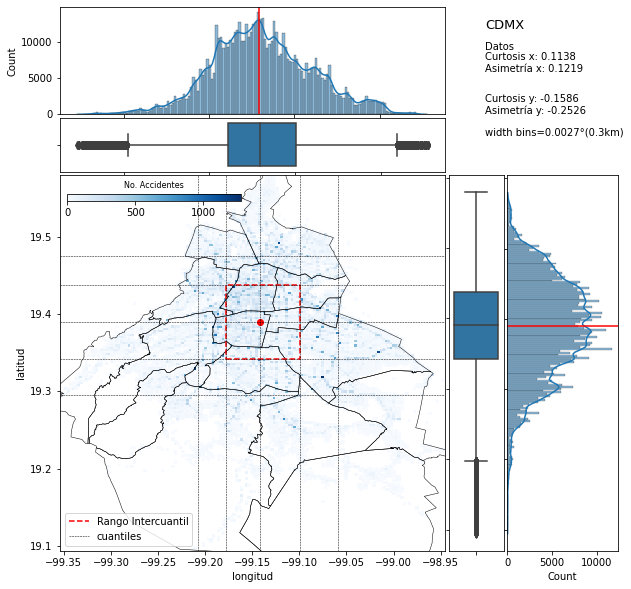

In [ ]:
#Se grafica todos los datos de accidentes
graf_bar_hist(data_code_A,xdata='longitud',ydata='latitud', k=0.3/111.1,delimitacion=alcaldias,titulo='CDMX');

no se hace un cambio un el widht bins, agrupados los accidentes en este caso por cada $0.3km^2$. Con la cantidad anterior se hace evidente un patrón en forma de avenidas principales de la ciudad. Entonces,  el objetivo es dar explicación a este patrón.

### 4.3 Selección de las puntos con mayor incidencia



In [ ]:
def mayor_densidad(data,x,y,umbral,escala):
  columnas = data[[x,y]]
  M = columnas.max()
  m = columnas.min()

  segy = np.arange(m[y],M[y], escala)
  segx = np.arange(m[x],M[x], escala)  

  H, xedges, yedges = np.histogram2d(data[x], data[y], bins=(segx, segy))

  ind = np.where(H>umbral)

  yc = segy[ind[1]]
  xc = segx[ind[0]]

  return H,xc,yc

In [ ]:
H,xc,yc = mayor_densidad(data=data_code_A,x='longitud',y='latitud',umbral=500,escala=0.3/111.1)

In [ ]:
mayor_incidentes = pd.DataFrame({'longitud':xc,'latitud':yc})
mayor_incidentes = transform_data(mayor_incidentes)

[(19.09402002, 19.579320000000006), (-99.35449897, -98.94537)]

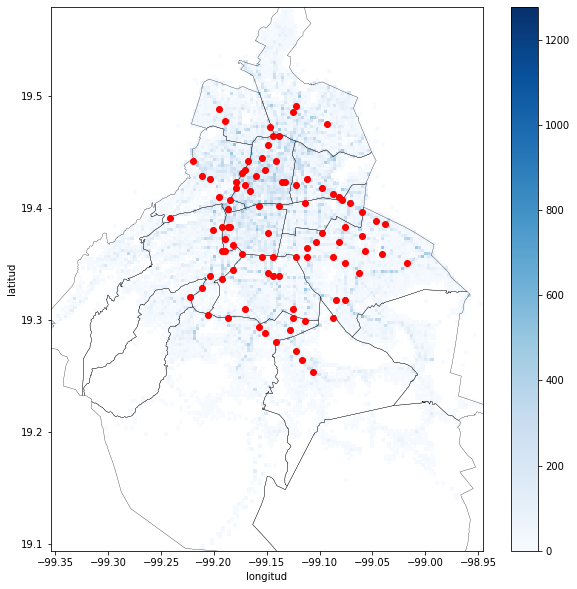

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(10, 10) ) 

sns.histplot(data_code_A,x='longitud',y ='latitud',cmap='Blues',
             ax=axes,binwidth=0.3/111.1,kde=True, cbar=True)
alcaldias.plot(ax=axes,markersize=0.5,facecolor="none", edgecolor='black', lw=0.3 )

#viasprincipales.plot(ax=axes, edgecolor='red', lw=0.5,alpha=0.5 )

axes.scatter(xc,yc,color='red')

axes.set(xlim =(data_code_A['longitud'].min(),data_code_A['longitud'].max()),
         ylim =(data_code_A['latitud'].min(),data_code_A['latitud'].max()))


### 5 Distribución Variables Categóricas


### 5.1 Distribuciones generales

Después de haber identificado las variables categóricas, se graficaron las relaciones entre estas de varias maneras. Esto nos permitió una visualización más detallada de las mismas para poder generar interpretaciones 

In [ ]:
columnas_categoricas = [ 'ano', 'mes', 'dia_semana', 'incidente_c4', 'codigo_cierre','tipo_entrada', 
            'clas_con_f_alarma','delegacion_inicio', 'delegacion_cierre']

In [ ]:
#Función para graficar los conteos de las variables categoricas
def graf_count(data,nombre,porcentaje = False,orien='v',):
  C = data[nombre].value_counts()
  if orien == 'h':
      if porcentaje == False:
        ax = sns.barplot(C,C.index,orient='h');
        ax.set(xlabel='count',title=nombre)
      else:
        P  = C*100/C.sum()
        ax = sns.barplot(P,P.index,orient='h');
        ax.set(xlabel='Porcentaje %',title=nombre)
  else:
    if porcentaje == False:
      ax = sns.barplot(C.index,C);
      ax.set(ylabel='count',title=nombre)
    else:
      P  = C*100/C.sum()
      ax = sns.barplot(P.index,P);
      ax.set(ylabel='Porcentaje %',title=nombre)


In [ ]:
#función que calcula los conteos de variables categoricas de und dataset
def frecuencias(data,columnas_categoricas):
  frecuencias_generales = {}
  for i in columnas_categoricas:
    frecuencias_generales [i] = data[i].value_counts()
  return frecuencias_generales


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


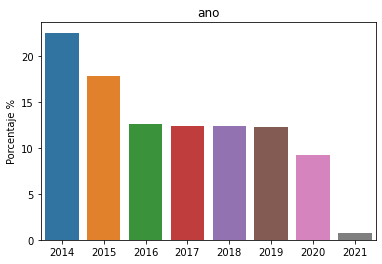

In [ ]:
graf_count(data_code_A,'ano',porcentaje=True)

Al visualizar el porcentaje de accidentes ocurridos por año respecto a la cantidad total de los mismos, se observa que porcentaje de hechos ocurridos durante el año 2014 es bastante grande, posteriormente existe una disminución de casi el 25% de accidentes ocurridos en 2014.
Por otra parte, la cantidad de hechos ocurridos de 2016 a 2019 es casi menos de la mitad de los ocurridos en 2014. Se puede suponer que las medidas tomadas por la administración de la ciudad respecto a la vialidad, que podrían incluir el aumento de vigilancia, multas más altas, regulación de la cantidad de autos que transitan al mismo tiempo, etc; fueron efectivas, sin embargo, aún no se pueden determinar las relaciones del decrecimiento. 
Finalmente, debido a la falta de datos correspondientes al año en curso, es una categoría que aún no se puede utilizar para determinar conclusiones; sin embargo, por la tendencia a la baja de los accidentes que ocurren en la ciudad, parecería predecible que la cantidad de accidentes en 2021 será menor o igual a la de 2020.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


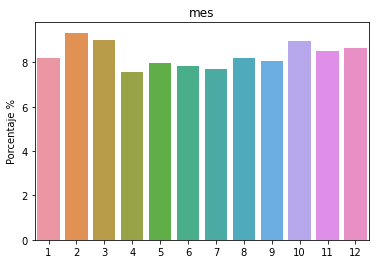

In [ ]:
graf_count(data_code_A,'mes',porcentaje=True)

En esta gráfica se observa el porcentaje de accidentes ocurridos cada mes desde el conjunto total de datos en el que no se hacen distinciones por año. Es evidente que los meses con mayor concentración de accidentes es Febrero, Marzo y Octubre; de la misma manera, los meses con menos acontecimientos registrados son Abril y Julio por poca diferencia. 


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


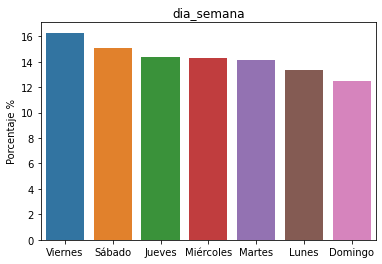

In [ ]:
graf_count(data_code_A,'dia_semana',porcentaje=True)

La gráfica muestra el porcentaje de accidentes ocurridos por día de la semana, donde es evidente que el día con más incidentes es el Viernes, aunque la diferencia con los porcentajes de los demás días no sea muy grande. Se puede suponer que es uno de los días con más afluencia de autos en la ciudad por lo que ocurre un mayor número de accidentes viales. 



/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


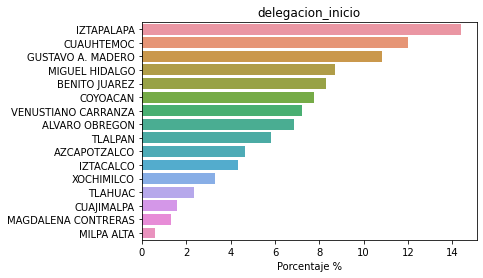

In [ ]:
graf_count(data_code_A,'delegacion_inicio',porcentaje=True,orien='h');

La gráfica anterior permite visualizar de manera más clara el porcentaje de accidentes que ocurren por delegación. El mayor porcentaje de accidentes ocurridos se ubican en Iztapalapa,seguido de las delegaciones Cuauhtemoc y Gustavo A. Madero. Mientras que las delegaciones Cuajimalpa, Magdalena Contreras y Milpa Alta tienen el menor porcentaje de accidentes. Es importante resaltar que en Iztapala acontecen aproximadamente el 13.5 porciento más de los incidentes viales que en Milpa Alta. 

### 5.2 Análisis Multivariable 

Después de identificar las variables categóricas y numéricas dentro del dataset utilizado, se realizaron algunas tablas de relaciones que permitieron visualizar de mejor manera la posible existencia de un vívulo entre dichas variables.

In [ ]:
delegacion_ano=pd.crosstab(data_code_A['delegacion_inicio'], data_code_A['ano'])
delegacion_ano

ano,2014,2015,2016,2017,2018,2019,2020,2021
delegacion_inicio,,,,,,,,
ALVARO OBREGON,10144,7272,5016,5328,5534,5021,3641,283
AZCAPOTZALCO,6200,5337,3573,3533,3706,3472,2631,182
BENITO JUAREZ,11159,9597,6698,6089,6329,6487,4248,330
COYOACAN,10926,8924,6059,6471,5562,5532,3999,318
CUAJIMALPA,2129,1638,1181,1468,1238,1118,874,65
CUAUHTEMOC,16635,12676,9524,8925,9462,9192,6628,564
GUSTAVO A. MADERO,15118,11910,8575,8513,8253,7876,5887,500
IZTACALCO,5558,4770,3570,3349,3428,3297,2521,195
IZTAPALAPA,20304,15763,10798,10384,10462,10941,8969,754


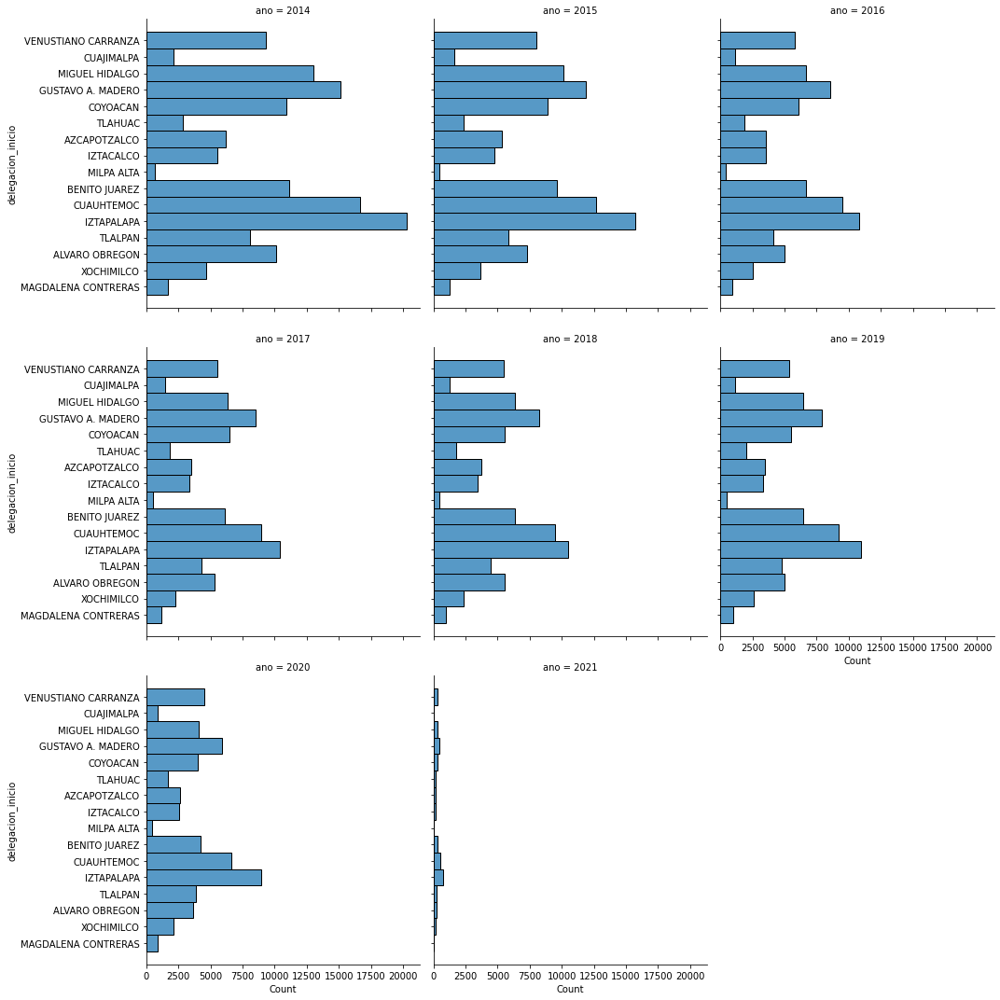

In [446]:
sns.displot(data=data_code_A, y="delegacion_inicio", col="ano" ,kind='hist',col_wrap=3)

En la tabla mostrada se buscó visualizar de mejor manera la cantidad de accidentes ocurridos en cada delegación por año. 
Parece evidente, con este análisis más detallado, que en Iztapalapa acontencen la mayor cantidad de accidentes todos los años registrados.
Por otra parte, con la utilización de este resultado, se puede obtener el porcentaje de reducción de accidentes por año en cada delegación, y de esta manera, enfocar una investigación sobre las medidas tomadas por la autoridades en cada región para relacionar el procentaje de reducción con posibles antecedentes de mejoramiento de calles, semaforos, infraestructura, aumneto de vigilancia, aumento de señalizaciones, etc. 


In [ ]:
delegacion_accidente=pd.crosstab(data_code_A['delegacion_inicio'], data_code_A['incidente_c4'])
delegacion_accidente

incidente_c4,accidente-choque con lesionados,accidente-choque con prensados,accidente-choque sin lesionados,accidente-ciclista,accidente-ferroviario,accidente-monopatín,accidente-motociclista,accidente-otros,accidente-persona atrapada / desbarrancada,accidente-vehiculo atrapado,accidente-vehiculo desbarrancado,accidente-vehículo atrapado-varado,accidente-volcadura,cadáver-accidente automovilístico,cadáver-atropellado,detención ciudadana-accidente automovilístico,detención ciudadana-atropellado,lesionado-accidente automovilístico,lesionado-atropellado,mi ciudad-calle-incidente de tránsito,sismo-choque con lesionados,sismo-choque con prensados,sismo-choque sin lesionados,sismo-persona atropellada
delegacion_inicio,,,,,,,,,,,,,,,,,,,,,,,,
ALVARO OBREGON,8064,25,25627,62,0,0,1688,131,225,34,25,24,993,69,98,1,9,190,4959,0,5,0,10,0
AZCAPOTZALCO,6546,19,16400,75,2,0,966,72,70,15,1,14,454,50,63,1,4,135,3739,0,3,0,5,0
BENITO JUAREZ,11208,13,29829,161,3,3,1528,134,528,26,0,31,846,41,64,4,13,223,6253,1,11,0,16,1
COYOACAN,10107,21,28396,109,1,1,1653,83,183,20,3,25,818,67,99,2,19,225,5936,0,9,0,14,0
CUAJIMALPA,2039,14,4964,8,0,0,438,30,83,12,31,5,952,21,25,1,0,71,997,0,4,0,15,1
CUAUHTEMOC,16522,33,37849,291,0,6,2845,250,940,73,2,43,766,62,158,3,20,295,13399,0,20,1,28,0
GUSTAVO A. MADERO,14328,49,38374,137,2,0,2522,170,151,57,6,46,1040,110,199,3,18,306,9094,0,5,0,15,0
IZTACALCO,6127,16,14881,63,1,0,999,53,65,29,0,10,325,46,78,1,7,121,3851,0,7,0,8,0
IZTAPALAPA,17036,69,51206,136,0,1,3375,162,132,67,2,43,1495,205,330,13,40,401,13599,1,20,0,40,2


En la tabla se muestran las cantidades de accidentes por tipo en cada delegación, de esta forma se pudo identificar el tipo de accidente más recurrente en cada región. La delegación con más incidentes, Iztapalapa, tiene como principales tipos los choques sin lecionados. Y en general, el tipo de accidente más común en todas las alcaldías es el choque sin lecionados.
Se esperaba obtener un accidente característico en las alcaldías que pudiera dar pistas sobre las posibles causas del mismo, sin embargo la descripción de los accidentes tampoco es muy amplia. 
Hechos que parece curioso observar es que la alcaldía con más accidentes con ciclistas y monopatín es Cuauhtemoc, Tlalpan tiene la mayor cantidad de accidentes con vehiculos desbarrancados e Iztapalapa tiene la mayor cifra de atropellados por detención ciudadana y de choques en un sismo. 


In [ ]:
delegacion_dia=pd.crosstab(data_code_A['delegacion_inicio'], data_code_A['dia_semana'])
delegacion_dia

dia_semana,Domingo,Jueves,Lunes,Martes,Miércoles,Sábado,Viernes
delegacion_inicio,,,,,,,
ALVARO OBREGON,5001,6068,5828,6057,6129,6221,6935
AZCAPOTZALCO,3052,4302,3958,4172,4101,4197,4852
BENITO JUAREZ,4887,8023,6631,7690,7764,7093,8849
COYOACAN,5648,7019,6246,6988,6878,7250,7762
CUAJIMALPA,1331,1269,1335,1346,1423,1426,1581
CUAUHTEMOC,8092,11067,9427,10570,10745,11014,12691
GUSTAVO A. MADERO,8579,9347,8994,9140,9465,10191,10916
IZTACALCO,3318,3740,3430,3638,3843,4174,4545
IZTAPALAPA,12704,11821,11995,12128,11939,14364,13424


Por medio de la tabla se observan las cantidades de accidentes que ocurrieron en los días en cada alcaldía. En general los días en los que ocurrieron la mayor cantidad de accidentes en la mayoría de las alcaldías son los viernes y sábados, donde podría suponerse que son los días con más afluencia de autos. 
Por otra parte, los días en los que no ocurren una gran cantidad de accidentes en varias alcaldías son domingo y lunes. Sin embargo, en Milpa Alta, Tlahuac, Tlalpan y Xochimilco, la mayor cantidad de accidentes ocurridos son en domingo.

In [ ]:
accidente_mes=pd.crosstab(data_code_A['incidente_c4'], data_code_A['mes'])
accidente_mes

mes,1,2,3,4,5,6,7,8,9,10,11,12
incidente_c4,,,,,,,,,,,,
accidente-choque con lesionados,10766,12237,11734,10134,10567,10236,10441,11137,10360,11451,11067,11501
accidente-choque con prensados,50,41,40,29,30,38,29,38,31,36,30,50
accidente-choque sin lesionados,28083,32340,31620,26378,27814,27700,26896,28625,28222,31637,29467,29528
accidente-ciclista,99,169,103,57,40,81,77,97,191,188,192,173
accidente-ferroviario,1,0,2,0,2,2,2,1,1,3,2,1
accidente-monopatín,0,1,0,1,0,0,0,0,6,6,0,2
accidente-motociclista,1908,2415,2016,1751,1628,1722,1761,1849,2043,2012,2004,2336
accidente-otros,131,150,139,112,160,118,127,142,126,150,125,150
accidente-persona atrapada / desbarrancada,233,288,275,236,242,265,277,300,282,259,271,258


Debido a la observación de los meses en los que ocurre la mayor cantidad de accidentes, se realizón la tabla anterior en la que se observan la cantidad de accidentes ocurridos por tipo en cada mes; de esta forma, nos permitiría generar suposiciones por si el tipo de accidente tiene alguna relación con el mes en e que ocurre. 
Se observa que en el mes con más incidentes, Febrero, los accidentes más comunes son choques sin lecionados y choques con lesionados, que al igual que en las tablas anteriores, la poca descripción de los accidentes no permiten suponer una causa posible. 
Otras observaciones hechas es que el mes con más accidentes con ciclistas es Noviembre, la mayor cantidad de accidentes con personas atrapadas con auto desbarrancado y vehiculos atrapados ocurren en Agosto, y el mes con más choques en sismo es Marzo.

In [ ]:
accidente_dia=pd.crosstab(data_code_A['incidente_c4'], data_code_A['dia_semana'])
accidente_dia

dia_semana,Domingo,Jueves,Lunes,Martes,Miércoles,Sábado,Viernes
incidente_c4,,,,,,,
accidente-choque con lesionados,19899,17923,16415,16980,17465,22479,20470
accidente-choque con prensados,86,54,50,48,51,90,63
accidente-choque sin lesionados,37467,52001,47643,51689,52514,48606,58390
accidente-ciclista,230,214,176,177,226,221,223
accidente-ferroviario,2,2,5,1,2,2,3
accidente-monopatín,3,4,2,1,3,2,1
accidente-motociclista,3941,2936,2993,2910,2957,4078,3630
accidente-otros,261,205,223,201,239,273,228
accidente-persona atrapada / desbarrancada,586,408,371,399,389,589,444


Al igual que la tabla anterior, se muestran las cantidades de accidentes ocurridos por tipo en cada día de la semana. Se observa mejor que los tipos de accidentes que ocurren en los días con mayor concurrencia de datos, viernes y sábado, son choques sin lesionados, choques con lesionados y accidentes sin lesionados. Los accidentes con ciclistas ocurren mayormente en domingo y miercoles, accidentes con motociclistas en sábado y domingo, los accidentes con atropellados por detección ciudadana ocurren mayormente en sábado y los choques en sismos sin lesionados en viernes. 

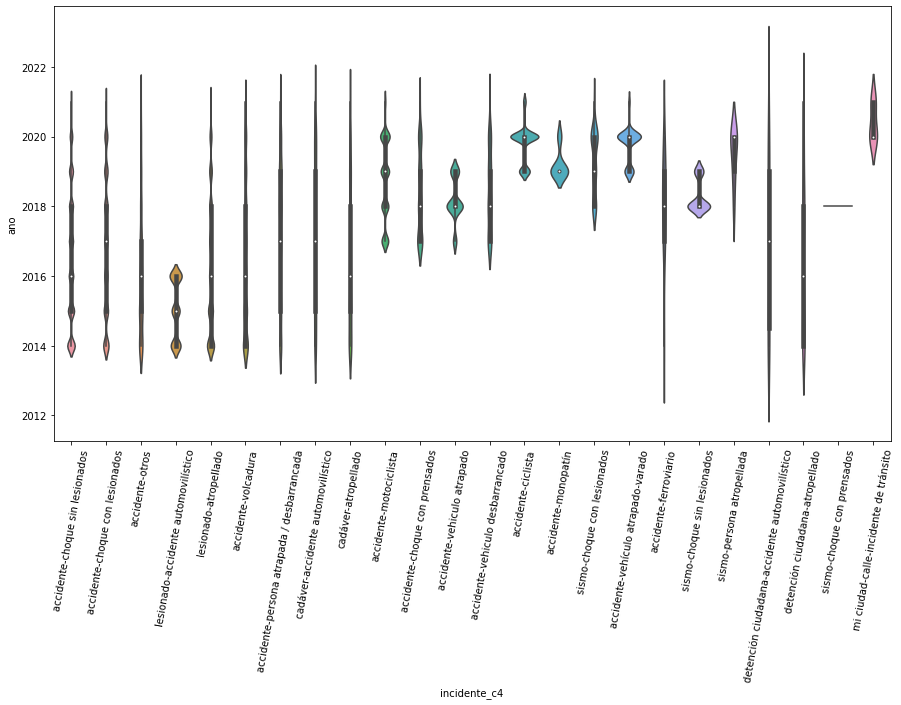

In [ ]:
fig, axes = plt.subplots(figsize=(15,8))
axes.tick_params(axis='x', rotation=80)
sns.violinplot(x='incidente_c4', y='ano', data=data_code_A, ax=axes)

En la grafica de violinplot se observa la distribución de datos por tipo de accidente durante los años resgitrados. En la misma se observan concentraciones proporcionales cada año de accidentes de choque con lesionados y choque sin lesionados, sin embargo los accidentes con lesionados dejaron de registrarse en 2017. Por otra parte, otros tipos de categorías se agregan en 2017 implicando así, un replanteamiento de los datos que deben tomarse en cuenta en el análisis. 

In [ ]:
def graf_map_cloroplet(datos_geo,datos_num,columnas,mapa,titulo=''):
  folium.Choropleth(
      geo_data=datos_geo,
      name='Incidentes CDMX',
      data=datos_num,
      columns=columnas,
      key_on='feature.properties.'+columnas[0],
      fill_color='YlGn',
      fill_opacity=.5,
      legend_name=titulo
  ).add_to(mapa)

In [ ]:
def graf_clroplet_crostab(datos_geo,datos_num,columnas):
  df_data = datos_num.reset_index().rename(columns={'delegacion_inicio':'Alcaldia'})
  df_data = df_data.rename(columns= dict(zip(df_data.columns,df_data.columns.astype(str) )))
 
  centro = [19.432566, -99.133195]
  Tmap =['Stamen Terrain','CartoDB Positron','Mapbox', ]
  m = folium.Map(location= centro, tiles=Tmap[1],
                        zoom_start=10,prefer_canvas=True,
                        max_zoom=16,min_zoom=9,
                        width='65%',height='75%')
  
  graf_map_cloroplet(datos_geo,df_data,columnas,m,titulo = 'Incidentes '+columnas[1])
  folium.map.LayerControl('topleft', collapsed= False).add_to(m)

  style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                              'weight': 0.1}
  highlight_function = lambda x: {'fillColor': '#000000', 
                                  'color':'#000000', 
                                  'fillOpacity': 0.50, 
                                  'weight': 0.1}

  datos_geo['incidentes'] = df_data[columnas[1]].apply(lambda x: f'{x:,}')

  # Estructua tooltip
  NIL = folium.features.GeoJson(
      datos_geo,
      style_function=style_function, 
      control=False,
      highlight_function=highlight_function, 
      tooltip=folium.features.GeoJsonTooltip(
          fields= ['Alcaldia','incidentes'],
          aliases=['Alcaldia','incidentes'])    )
  
  m.add_child(NIL)
  m.keep_in_front(NIL)

  return m

In [ ]:
mapa = graf_clroplet_crostab(alcaldias,delegacion_dia,['Alcaldia','Domingo'])
mapa

In [ ]:
mapa = graf_clroplet_crostab(alcaldias,delegacion_ano,['Alcaldia','2020'])
mapa

### 6. Serie de tiempo

In [ ]:
serie_accidentes = pd.DataFrame(data_code_A.groupby(['fecha_creacion']).size())

In [ ]:
serie_accidentes = serie_accidentes.reset_index()

In [ ]:
dias = pd.Series(serie_accidentes.index)
incidentes = pd.Series(serie_accidentes[0])

In [ ]:
lr = LinearRegression()
lr.fit(dias.to_frame(),incidentes)
y_predict = lr.predict(dias.to_frame())

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


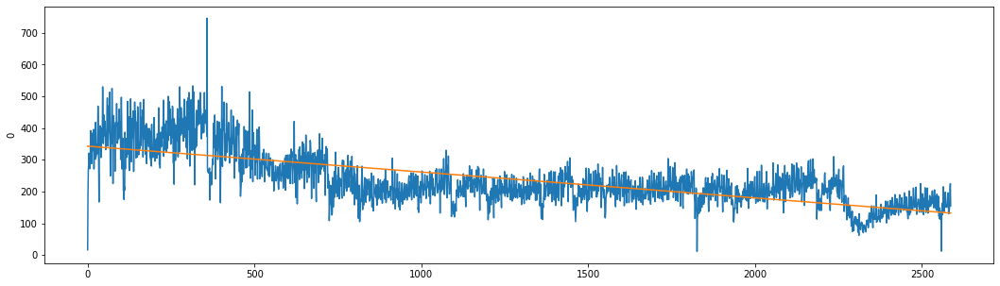

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(18, 5) ) 
sns.lineplot(dias,incidentes,ax=axes)
sns.lineplot(dias, y_predict);

## 7. Comparación de los datos

### 7.1 Rutas y vías vs alta densidad

In [ ]:
def circulos(data,x,y,mapa,radio=500,nombre='',color='crimson'):
  capa = folium.FeatureGroup(nombre)

  for i in range(0,len(data)):
    folium.Circle(
        location=[data.iloc[i][y], data.iloc[i][x]],
        #popup=data.iloc[i]['name'],
        radius=radio,
        color=color,
        fill=False ).add_to(capa)
  
  capa.add_to(mapa)

In [ ]:
def mapdata(data,mapa,tipo='heat'):
  heat_data = [[point.xy[1][0], point.xy[0][0]] for point in data.geometry ]

  if tipo == 'heat' :
    folium.plugins.HeatMap(heat_data).add_to(mapa)
  elif tipo == 'cluster':
    folium.plugins.MarkerCluster(heat_data).add_to(mapa)

In [439]:
#Se crea un mapa para añadir información
centro = [19.432566, -99.133195]
Tmap =['Stamen Terrain','CartoDB Positron','Mapbox', ]
mapa_cdmx = folium.Map(location= centro, tiles=Tmap[1],
                       zoom_start=10,prefer_canvas=True,
                       max_zoom=16,min_zoom=9#, width='50%',height='70%'
                       )

In [440]:
add_data(alcaldias,mapa_cdmx,'Alcaldias','black',grosor=1)
add_data(rutas,mapa_cdmx,'Rutas','blue',grosor=0.2)
add_data(viasprincipales,mapa_cdmx,'Vías principales','red',grosor=0.7)

In [441]:
#add_data(mayor_incidentes,mapa_cdmx,'Mayor incidentes')
circulos(mayor_incidentes,'longitud','latitud',mapa_cdmx,300,'Alta densidad','green')

In [442]:
folium.map.LayerControl('topleft', collapsed= False).add_to(mapa_cdmx)

In [443]:
mapa_cdmx

In [445]:
mapa_cdmx.save(outfile= "Mayor_incidencia_y_rutas.html")

## 8. Cluster

In [ ]:
k_means = KMeans(n_clusters=6, max_iter=10000)
clasificacion = k_means.fit(mayor_incidentes[['longitud','latitud']])
centers = k_means.cluster_centers_
pred = k_means.predict(mayor_incidentes[['longitud','latitud' ]])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[(19.09402002, 19.579320000000006), (-99.35449897, -98.94537)]

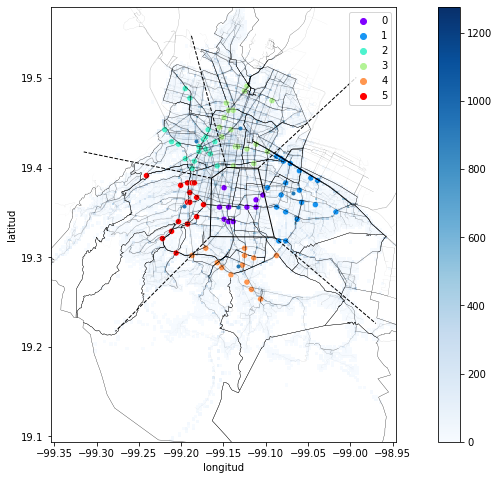

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(15, 8) ) 


sns.histplot(data_code_A,x='longitud',y ='latitud',cmap='Blues',
             ax=axes,binwidth=0.3/111.1,kde=True, cbar=True)
alcaldias.plot(ax=axes,markersize=0.5,facecolor="none", edgecolor='black', lw=0.3 )

rutas.plot(ax=axes,markersize=0.5,facecolor="none", edgecolor='black', lw=0.1,alpha=0.1 )

v = Voronoi(centers)
voronoi_plot_2d(v,ax=axes,show_vertices=False)
viasprincipales.plot(ax=axes,markersize=0.5,facecolor="none", edgecolor='black', lw=0.5,alpha=0.3 )

sns.scatterplot(mayor_incidentes['longitud'], mayor_incidentes['latitud'], ax=axes, hue=pred , palette='rainbow');

axes.set(xlim =(data_code_A['longitud'].min(),data_code_A['longitud'].max()),
         ylim =(data_code_A['latitud'].min(),data_code_A['latitud'].max()))



Se realizó una clasificación a los datos de alta densidad de incidentes. Se considero una clasficiación en 6 regiones las cuales serviran para estudiar a futuro la relación de las vías principales dentro de cada una de ellas. El resultado de la clasficación son poligonos 5 poligonos que se distribuyes al rededor de otro. 

## 9. Conclusiones

Tomando en cuenta los puntos observados en la entrega de la segunda fase, con la utilización de más bases de datos y de los conocimientos adquiridos durante la primera parte de la tercera fase, se observaron los puntos geográficos de mayor incidencia de accidentes que pudieron relacionarse con la afluencia de automóviles debido a la ubicación de vías principales y rutas transitadas por el transporte público. 

Se determinó que la mayor parte de los accidentes se distribuyen en la parte norte de la ciudad, en las delegaciones de Iztapalapa, benito Juárez y Coyoacán. Además el conteo de accidentes por $0.3k^2$ presenta un patrón el cual concuerda con las vías de transporte. Con un análisis espacial se concluyo que la mayor parte de las regiones con alta densidad de accidentes se encuentra sobre vías principales y en lugares con una alta densidad de rutas de transporte.

Se amplió la perspectiva de la distribución de los datos respecto a los años, las alcaldías en las que acontecieron y se observaron los días y meses en los que ocurren con más frecuencia. A través de un análisis multivariado se determinó que la delegación de Iztapalapa presenta el mayor número de incidentes viales a lo largo de todos los años y es la delegación con mayor número de accidentes de motocicleta. Además en general los días en los que ocurrieron la mayor cantidad de accidentes en la mayoría de las alcaldías son los viernes y sábados.

De igual forma, este análisis puede dar pie a una investigación sobre la condición de las vías en donde se presentan la mayor cantidad accidentes, con el fin de proponer soluciones. 

## 10. Planes a futuro

Una vez identificado las zonas con alto indicé de incidentes viales, se plantea realizar el mismo procedimiento de segmentación por umbral pero aplicando más umbrales. Con el procedimiento anterior obtendremos un mapa que mostrara el índice de accidentes en un número específico de categorías. 

Después con los datos de Rutas de la CDMX se realizará un proceso de intersección a cada uno de las LINESTRING, obteniendo una nube de puntos de intersecciones. Con la nube resultante se realizará un histograma 2D y se obtendrán las regiones donde existe una mayor densidad intersección de rutas. 

Por otra parte se realizará un filtro de los datos que se encuentran dentro de un círculo de un radio R con centro en cada uno de los puntos de mayor densidad de incidentes. Así se observará los tipos de accidentes que suceden en estas zonas.

Se determinará que vía principal y/o ruta se encuentran dentro de ese radio para cada punto de mayor densidad de incidentes. Luego con los polígonos de las vías y/o rutas más recurrentes se plantea realizar una clasificación de los incidentes viales.

Entonces se podría continuar el análisis del datase de incidentes viales a través de técnicas de Machine Learning y utilizando la clasificación de los puntos con respecto a las vías principales y/o rutas.